mod = torch.load(os.path.join(datadir, '2021-12-10_best_rna_model.pth'))
#del mod['params']['num_batches']

#torch.save(mod, os.path.join(datadir, '2021-12-10_best_rna_model.pth'))

mod['fit_params']['num_batches'] = 0
mod['params']['batch_key'] = None

torch.save(mod, os.path.join(datadir, '2021-12-10_best_rna_model.pth'))

In [1]:
import mira
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import torch
import os
import matplotlib.pyplot as plt
mira.utils.wide_view()

datadir = '/Users/alynch/Dropbox (Partners HealthCare)/Data/neuroendocrine/'

rna_data = anndata.read_h5ad(os.path.join(datadir,'2021-12-10_rna_data.h5ad'))
atac_data = anndata.read_h5ad(os.path.join(datadir, '2021-12-10_atac_data.h5ad'))
old_rna_model = mira.topics.ExpressionTopicModel.load(os.path.join(datadir, '2021-12-10_best_rna_model.pth'))
atac_model = mira.topics.AccessibilityTopicModel.load(os.path.join(datadir, '2021-12-16_atac_model_big.pth'))

INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu


In [2]:
rna_data.var['exog'] = rna_data.var_names.isin(old_rna_model.features)
rna_data.var['endog'] = rna_data.var_names.isin(old_rna_model.features[old_rna_model.highly_variable])

In [3]:
rna_data.obs['timepoint'] = rna_data.obs_names.str.split('-').str.get(-1)

In [4]:
bruh = old_rna_model.get_params()
bruh.pop('endogenous_key')
bruh.pop('exogenous_key')
bruh['num_topics'] = 26
bruh['decoder_dropout'] = 0.2

In [5]:
rna_model = mira.topics.ExpressionTopicModel(
    endogenous_key='exog', exogenous_key='exog', 
    **bruh)

In [9]:
rna_model.get_learning_rate_bounds(rna_data)

INFO:mira.adata_interface.topic_model:Predicting expression from genes from col: exog
INFO:mira.adata_interface.topic_model:Using highly-variable genes from col: exog
Learning rate range test: 100%|███████████████████████████████████████████████████████████████████████████| 172/172 [00:59<00:00,  2.91it/s]
INFO:mira.topic_model.base:Set learning rates to: (0.00011241779101655927, 0.16452246999190048)


(0.00011241779101655927, 0.16452246999190048)

INFO:mira.topic_model.base:Set learning rates to: (0.002257971692286296, 0.09978792226173934)


<AxesSubplot:xlabel='Learning Rate', ylabel='Loss'>

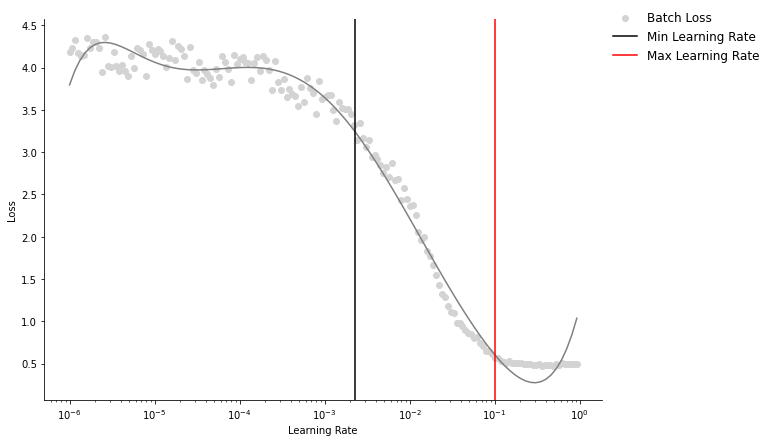

In [10]:
rna_model.trim_learning_rate_bounds(3,1)
rna_model.plot_learning_rate_bounds()

In [8]:
rna_model.set_params(**{'num_topics': 24, 'batch_size': 64, 'encoder_dropout': 0.028188488827178185, 'num_epochs': 25, 'beta': 0.9008836253803199, 'seed': 1106256213})

ExpressionTopicModel(
  (decoder): Decoder(
    (beta): Linear(in_features=26, out_features=5010, bias=False)
    (bn): BatchNorm1d(5010, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (drop): Dropout(p=0.2, inplace=False)
  )
  (encoder): ExpressionEncoder(
    (fc_layers): Sequential(
      (0): Sequential(
        (0): Linear(in_features=5011, out_features=128, bias=True)
        (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.01459377875300601, inplace=False)
      )
      (1): Sequential(
        (0): Linear(in_features=128, out_features=128, bias=True)
        (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.01459377875300601, inplace=False)
      )
      (2): Sequential(
        (0): Linear(in_features=128, out_features=54, bias=True)
        (1): BatchNorm1d(54, eps=1e-05, momentum=0.1, affine=T

rna_model = mira.topics.ExpressionTopicModel(
    endogenous_key='exog', exogenous_key='exog', batch_key='timepoint',
    **{'num_topics': 6, 'batch_size': 32, 'encoder_dropout': 0.10311127699884227, 'num_epochs': 21, 'beta': 0.9227435902664372, 'seed': 2644871821})
rna_model.set_learning_rates(0.0008306613643392185, 0.09978792226173934)

import seaborn as sns

r = [
    rna_model._get_KL_anneal_factor(i, n_epochs = 15, n_batches_per_epoch = 3000)
    for i in range(15 * 3000)
]
sns.lineplot(y = r, x = range(len(r)))

In [23]:
rna_model.fit(rna_data)

INFO:mira.adata_interface.topic_model:Predicting expression from genes from col: exog
INFO:mira.adata_interface.topic_model:Using highly-variable genes from col: exog
Epoch 26 done. Recent losses: 4.799e-01 --> 4.795e-01 --> 4.792e-01 --> 4.792e-01 --> 4.790e-01: 100%|████████████████████████████████████████████████████████████████████████| 25/25 [05:16<00:00, 12.68s/it]
INFO:mira.topic_model.base:Moving model to device: cpu


ExpressionTopicModel(
  (decoder): Decoder(
    (beta): Linear(in_features=24, out_features=5010, bias=False)
    (bn): BatchNorm1d(5010, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (drop): Dropout(p=0.2, inplace=False)
  )
  (encoder): ExpressionEncoder(
    (fc_layers): Sequential(
      (0): Sequential(
        (0): Linear(in_features=5011, out_features=128, bias=True)
        (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.028188488827178185, inplace=False)
      )
      (1): Sequential(
        (0): Linear(in_features=128, out_features=128, bias=True)
        (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): Dropout(p=0.028188488827178185, inplace=False)
      )
      (2): Sequential(
        (0): Linear(in_features=128, out_features=50, bias=True)
        (1): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine

rna_model = mira.topics.ExpressionTopicModel.load('data/neuroendocrine/best_rna_model_24_topics.pth')

In [24]:
rna_model.predict(rna_data)

Predicting latent vars: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [00:06<00:00,  5.58it/s]
INFO:mira.adata_interface.topic_model:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16, topic_17, topic_18, topic_19, topic_20, topic_21, topic_22, topic_23


0.47177148440579614


[None]

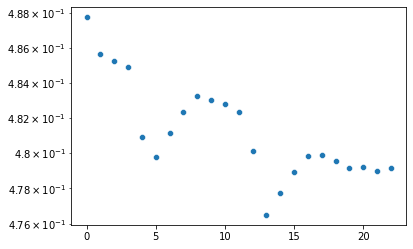

In [25]:
print(rna_model.score(rna_data))

import seaborn as sns

ax = sns.scatterplot(
    y = rna_model.training_loss[4:],
    x = range(len(rna_model.training_loss[4:]))
)
ax.set(yscale = 'log')

rna_model.save('data/neuroendocrine/batchtest.pth')

In [26]:
rna_model.get_phylo_ILR_features(rna_data, box_cox=0.25)
#rna_model.get_umap_features(rna_data, box_cox=0.5)
sc.pp.neighbors(rna_data, metric='manhattan', use_rep='X_umap_features', n_neighbors = 20)

INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features


In [27]:
#sc.pp.neighbors(rna_data, metric='hellinger', use_rep='X_topic_compositions', n_neighbors = 20)
sc.tl.umap(rna_data, min_dist=0.1, negative_sample_rate=1)

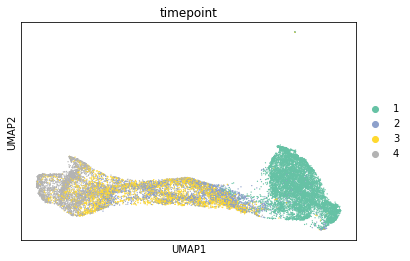

In [28]:
sc.pl.umap(rna_data, color = 'timepoint', palette = 'Set2')

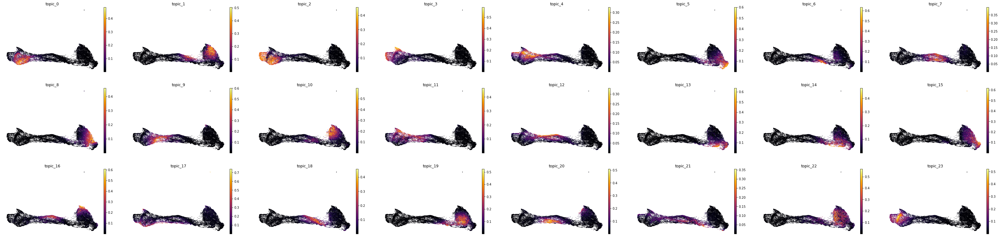

In [29]:
sc.pl.umap(rna_data, color = rna_model.topic_cols, **mira.pref.topic_umap())

rna_model.impute(rna_data)

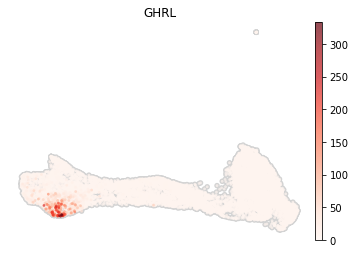

In [30]:
sc.pl.umap(rna_data, color = 'GHRL', **mira.pref.raw_umap())

rna_model.save('data/neuroendocrine/best_rna_model_24_topics.pth')
atac_model.batch_encoder= None
atac_model.save('data/neuroendocrine/nobatch_atac_model.pth')

## Joint representation

In [135]:
rna_model.num_topics = 24

In [152]:
atac_model.get_phylo_ILR_features(atac_data, box_cox=0.5)
rna_model.get_phylo_ILR_features(rna_data, box_cox=0.5)

INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features
INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features


In [168]:
rna_data, atac_data = mira.utils.make_joint_representation(rna_data, atac_data)

INFO:mira.adata_interface.utils:18482 out of 18482 cells shared between datasets (100%).
INFO:mira.adata_interface.utils:Key added to obsm: X_joint_umap_features


rna_model.predict(rna_data)
atac_model.predict(atac_data)

shared_cells = np.intersect1d(rna_data.obs_names, atac_data.obs_names)
atac_data = atac_data[shared_cells]
rna_data = rna_data[shared_cells]

rna_data.obsm['joint_phylo'] = np.hstack([rna_data.obsm['phylo_ilr'], atac_data.obsm['phylo_ilr']])

rna_data.obs = rna_data.obs.drop(columns = rna_data.obs.columns[rna_data.obs.columns.str.endswith('_atac')])

rna_data.obs = rna_data.obs.join(atac_data.obs[atac_model.topic_cols], rsuffix='_atac')
atac_data.obsm['X_umap'] = rna_data.obsm['X_umap']

In [160]:
rna_data.obsm['X_joint_umap_features'] = np.hstack([5*rna_data.obsm['X_umap_features'], atac_data.obsm['X_umap_features']])

In [161]:
sc.pp.neighbors(rna_data, use_rep='X_joint_umap_features', metric='manhattan', n_neighbors = 20)
sc.tl.umap(rna_data, min_dist = 0.1, negative_sample_rate=1)

In [162]:
rna_data.obs['timepoint'] = rna_data.obs_names.str.split('-').str.get(-1)

/Users/alynch/opt/miniconda3/envs/mirarep/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'timepoint' as categorical


<AxesSubplot:title={'center':'timepoint'}, xlabel='UMAP1', ylabel='UMAP2'>

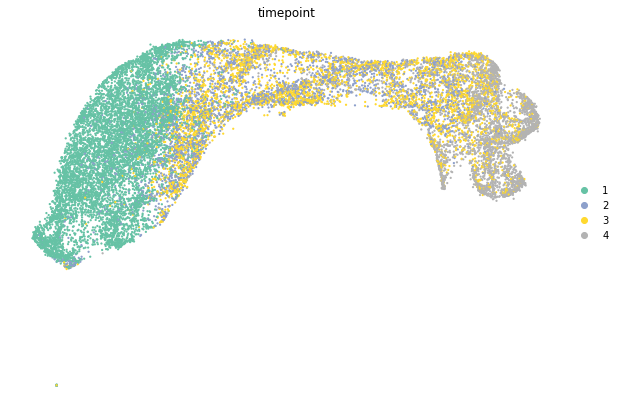

In [163]:
fig, ax = plt.subplots(1,1,figsize=(10,7))
sc.pl.umap(rna_data, na_color = 'black', color = 'timepoint', palette='Set2', size = 20, ax = ax, show = False, vmin = -1, outline_color=('black','white'), add_outline=False, outline_width=(1, 0),
          frameon=False)

In [164]:
import seaborn as sns

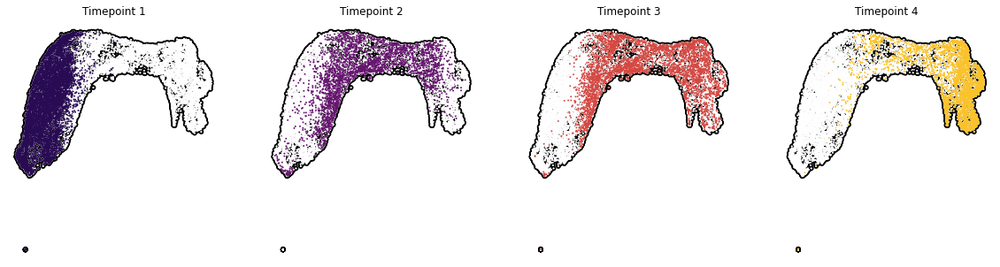

In [165]:
fig, ax = plt.subplots(1,4,figsize=(20,5))
for i in range(1,5):
    sc.pl.umap(rna_data, na_color = 'white', palette='Set2', 
            size = 15, ax = ax[i-1], show = False, outline_color=('black','white'), 
            add_outline=True, outline_width=(1, 0), frameon=False)
    sc.pl.umap(rna_data[rna_data.obs.timepoint == str(i)], na_color = sns.color_palette('inferno')[int(5/3*(i-1))], 
            size = 15, ax = ax[i-1], show = False, frameon=False, title = 'Timepoint ' + str(i))

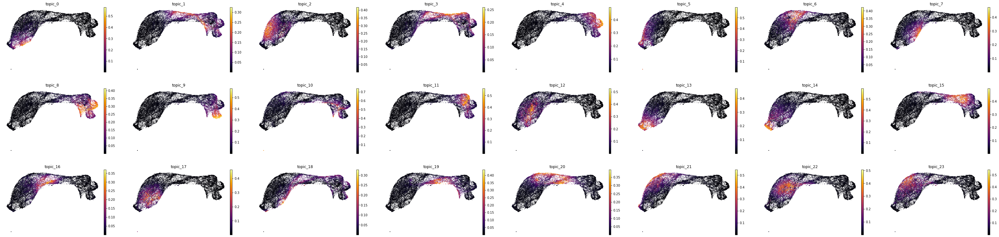

In [166]:
sc.pl.umap(rna_data, color = rna_model.topic_cols, **mira.pref.topic_umap())

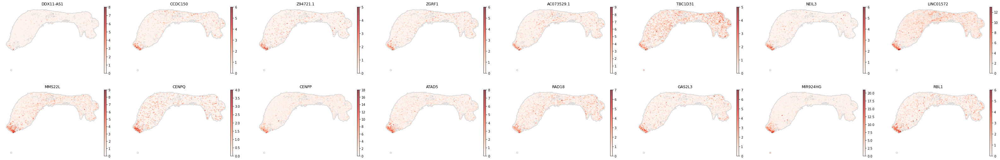

In [167]:
sc.pl.umap(rna_data, color = rna_model.get_top_genes(3, top_n=16), **mira.pref.raw_umap())

rna_data, atac_data = mira.utils.make_joint_representation(rna_data, atac_data)

In [98]:
atac_data = atac_data[rna_data.obs_names]
atac_data.obsm['X_umap'] = rna_data.obsm['X_umap']

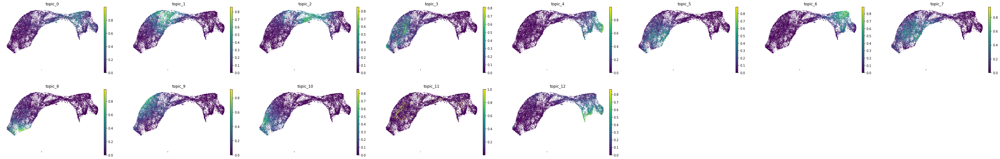

In [99]:
sc.pl.umap(atac_data, color = atac_model.topic_cols, **mira.pref.topic_umap(color_map='viridis'))

In [101]:
rna_data.write_h5ad('data/neuroendocrine/checkpoint_rna_data.h5ad')
atac_data.write_h5ad('data/neuroendocrine/checkpoint_atac_data.h5ad')

# Checkpoint

In [102]:
import mira
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import torch
import os
import matplotlib.pyplot as plt
import seaborn as sns
mira.utils.wide_view()

datadir = '/Users/alynch/Dropbox (Partners HealthCare)/Data/neuroendocrine/'

rna_data = anndata.read_h5ad('data/neuroendocrine/checkpoint_rna_data.h5ad')
atac_data = anndata.read_h5ad('data/neuroendocrine/checkpoint_atac_data.h5ad')
rna_model = mira.topics.ExpressionTopicModel.load(os.path.join(datadir, '2021-12-10_best_rna_model.pth'))
atac_model = mira.topics.AccessibilityTopicModel.load(os.path.join(datadir, '2021-12-16_atac_model_big.pth'))

INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu


## Pseudotime

rna_data, atac_data = mira.utils.make_joint_representation(rna_data, atac_data)

sc.pp.neighbors(rna_data, use_rep='X_joint_umap_features', metric = 'manhattan', n_neighbors = 20)

In [109]:
sc.pp.neighbors(rna_data, use_rep='X_joint_umap_features', metric='manhattan', n_neighbors = 20)

In [117]:
sc.tl.diffmap(rna_data)
mira.time.normalize_diffmap(rna_data, num_comps=3)

INFO:root:Added key to obsm: X_diffmap, normalized diffmap with 3 components.
INFO:root:Added key to uns: eigen_gap


<AxesSubplot:>

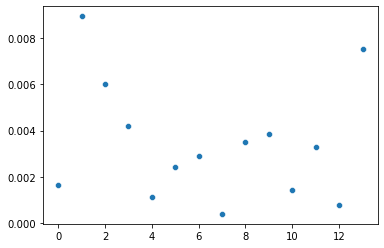

In [118]:
sns.scatterplot(y=rna_data.uns['eigen_gap'], x = range(14))

In [119]:
diffmap_cols = ['diffmap_' + str(i) for i in range(rna_data.obsm['X_diffmap'].shape[1])]
rna_data.obs[diffmap_cols] = rna_data.obsm['X_diffmap']

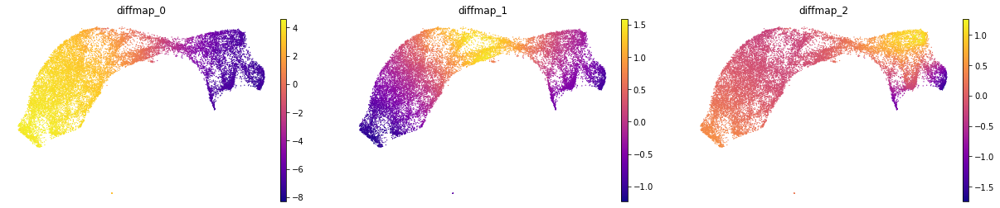

In [120]:
sc.pl.umap(rna_data, color = diffmap_cols, color_map='plasma', frameon=False)

In [121]:
sc.pp.neighbors(rna_data, n_neighbors = 20, use_rep='X_diffmap', key_added='X_diffmap')

In [122]:
mira.time.get_connected_components(rna_data)

INFO:mira.pseudotime.pseudotime:Found 1 components of KNN graph.
INFO:mira.adata_interface.core:Added cols to obs: mira_connected_components


In [123]:
mira.time.get_transport_map(rna_data, start_cell = rna_data.obs.topic_22.argmax())
                           # diffmap_distances_key='distances', diffmap_coordinates_key = 'X_joint_compositions')

INFO:mira.pseudotime.pseudotime:Calculating inter-cell distances ...
Calculating pseudotime:   4%|█████▌                                                                                                                                    | 2803/70075 [00:01<00:32, 2098.08it/s]
INFO:mira.pseudotime.pseudotime:Calculating transport map ...
INFO:mira.adata_interface.pseudotime:Added key to obs: mira_pseudotime
INFO:mira.adata_interface.pseudotime:Added key to obsp: transport_map
INFO:mira.adata_interface.pseudotime:Added key to uns: iroot


In [127]:
terminal_cells = mira.time.find_terminal_cells(rna_data, threshold=1e-2)

INFO:mira.pseudotime.pseudotime:Found 5 terminal states from stationary distribution.


sc.pl.scatter(rna_data, x = 'mira_pseudotime', y = 'topic_26')

<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

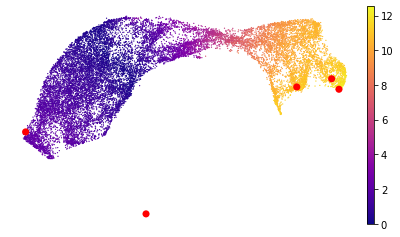

In [128]:
terminal_states = [17248, 908, 4753, 16147]#list(terminal_cells[[1,2,3,4]])

fig,ax=plt.subplots(1,1,figsize=(7,4))
sc.pl.umap(rna_data, color = 'mira_pseudotime', frameon = False, ax = ax, show = False, color_map = 'plasma')
sc.pl.umap(rna_data[terminal_cells], na_color = 'Red', size = 200, frameon = False, ax = ax, show = False)

In [60]:
mira.time.get_branch_probabilities(rna_data, terminal_cells = {
    k : v for k,v in zip('ABCDE',terminal_states)
})

INFO:mira.pseudotime.pseudotime:Simulating random walks ...
INFO:mira.adata_interface.pseudotime:Added key to obsm: branch_probs
INFO:mira.adata_interface.pseudotime:Added key to uns: lineage_names
INFO:mira.adata_interface.core:Added cols to obs: A_prob
INFO:mira.adata_interface.core:Added cols to obs: B_prob
INFO:mira.adata_interface.core:Added cols to obs: C_prob
INFO:mira.adata_interface.core:Added cols to obs: D_prob
INFO:mira.adata_interface.core:Added cols to obs: differentiation_entropy


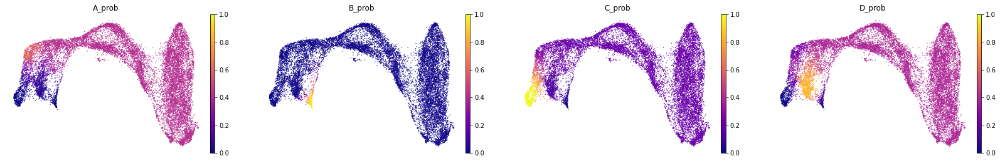

In [61]:
sc.pl.umap(rna_data, color = [l + '_prob' for l in rna_data.uns['lineage_names']], frameon = False, color_map='plasma')

INFO:mira.adata_interface.pseudotime:Added key to obs: tree_states
INFO:mira.adata_interface.pseudotime:Added key to uns: tree_state_names
INFO:mira.adata_interface.pseudotime:Added key to uns: connectivities_tree
/Users/alynch/opt/miniconda3/envs/mirarep/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'tree_states' as categorical


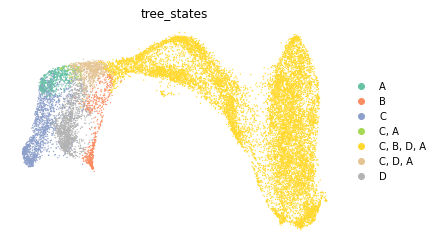

In [62]:
mira.time.get_tree_structure(rna_data, threshold = 0.1)
sc.pl.umap(rna_data, color = 'tree_states', palette = 'Set2', frameon = False)

from mira.plots.base import map_colors

def umap_3d(X, hue, palette = 'viridis', hue_order = None, size = 2, figsize = (10,5)):
    
    try:
        import plotly.graph_objects as go
    except ImportError:
        raise Exception('Must install plotly to use this feature. Run conda install plotly or pip install plotly.')

    color = map_colors(None, hue, palette, add_legend=False, hue_order = hue_order)

    if X.shape[-1] == 2:
        z_dim = np.zeros(len(X))
    else:
        z_dim = X[:,2]

    fig = go.Figure(data=[go.Scatter3d(
        x=X[:,0],
        y=X[:,1],
        z=z_dim,
        mode='markers',
        marker=dict(
            size=size,
            color = color,
            opacity=0.8
        ),
        hovertext=np.arange(len(X))
    )])

    fig.update_layout(scene=dict(xaxis = dict(showgrid=False, showticklabels = False, backgroundcolor="white", visible = False), 
                                yaxis = dict(showgrid=False, showticklabels = False, backgroundcolor="white", visible = False), 
                                zaxis = dict(showgrid = False, showticklabels = False, backgroundcolor="white", visible = False)),
                    width=figsize[0]*100, height=figsize[1]*100,
                    margin=dict(
                        r=0, l=0,
                        b=0, t=0)
                    )
    fig.show()
    return fig

_ = umap_3d(rna_data.obsm['X_umap'], rna_data.obs.tree_states.values.astype(str), palette='Set2')

/Users/alynch/projects/multiomics/mira/mira/mira/plots/swarmplot.py:200: UserWarning:

5.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.



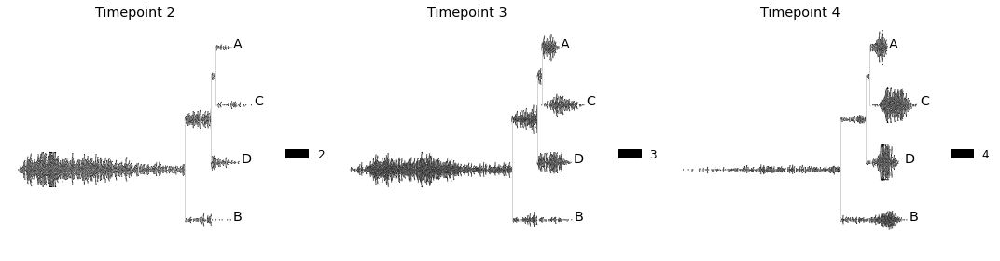

In [80]:
rna_data.obs.timepoint = rna_data.obs.timepoint.astype(str)

fig, ax = plt.subplots(1,3,figsize=(15,4))
for i, time in enumerate(rna_data.obs.timepoint.unique()[1:]):
    mira.pl.plot_stream(rna_data[rna_data.obs.timepoint == time], style = 'swarm', data='timepoint', palette=['black'],#, color = 'black', 
                        max_swarm_density=200, log_pseudotime=False, size = 1, linewidth=0.1, pseudotime_triangle=False,
                       hue_order=None, ax = ax[i], title = 'Timepoint ' + str(time))

In [31]:
atac_model.predict(atac_data)


Predicting latent vars: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37/37 [01:10<00:00,  1.91s/it]
INFO:mira.adata_interface.topic_model:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12


/Users/alynch/opt/miniconda3/envs/mirarep/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning:

The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.

... storing 'timepoint' as categorical


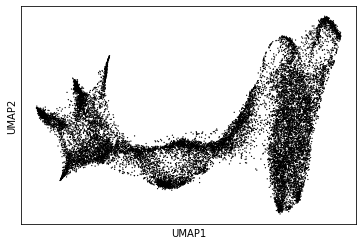

In [81]:
sc.pp.normalize_total(rna_data, target_sum=1e4)
sc.pp.log1p(rna_data)
sc.pp.scale(rna_data)
sc.tl.pca(rna_data)
sc.pp.neighbors(rna_data)
sc.tl.umap(rna_data, min_dist=0.1, negative_sample_rate=1)
sc.pl.umap(rna_data, na_color='black')

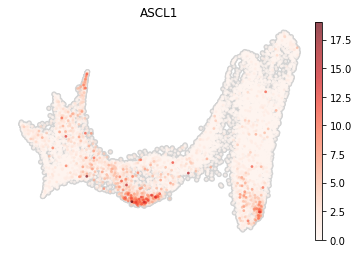

In [84]:
sc.pl.umap(rna_data, color = 'ASCL1', **mira.pref.raw_umap())

In [8]:
torch.hstack([torch.tensor([[1,2,],[3,4]]), None])

TypeError: expected Tensor as element 1 in argument 0, but got NoneType

In [11]:
torch.tensor([], requires_grad = False, dtype = torch.float).dtype

torch.float32

17248,   908,  4753, 16147

In [1]:
import mira
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import torch
import os
import matplotlib.pyplot as plt
import torch
mira.utils.wide_view()

datadir = 'data/neuroendocrine/'
dropbox = '/Users/alynch/Dropbox (Partners HealthCare)/Data/neuroendocrine'

In [2]:
rna_data = anndata.read_h5ad(os.path.join(dropbox,'2021-12-10_rna_data.h5ad'))
atac_data = anndata.read_h5ad(os.path.join(dropbox, '2021-12-10_atac_data.h5ad'))

In [3]:
rna_model = mira.topics.ExpressionTopicModel.load(os.path.join(datadir, '2021-12-20_best_rna_model_nobatch.pth'))
atac_model = mira.topics.AccessibilityTopicModel.load(os.path.join(datadir, '2021-12-21_best_all_atac_model.pth'))

INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu
INFO:mira.topic_model.base:Moving model to CPU for inference.
INFO:mira.topic_model.base:Moving model to device: cpu


with open('data/neuroendocrine/DA_peaks.txt', 'w') as f:
    print(*atac_data.var_names[atac_model.highly_variable], sep = '\n', file = f)

!scp data/neuroendocrine/DA_peaks.txt alynch@cistrome.org:/liulab/alynch/projects/multiomics/endocrine/MIRA/data/

In [4]:
rna_model.counts_layer = None

In [5]:
rna_model.predict(rna_data)

atac_model.predict(atac_data)

Predicting latent vars: 100%|███████████████████████████████████████████████████████████████████████████████| 37/37 [00:03<00:00,  9.73it/s]
INFO:mira.adata_interface.topic_model:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10, topic_11, topic_12, topic_13, topic_14, topic_15, topic_16, topic_17, topic_18, topic_19, topic_20, topic_21, topic_22
Predicting latent vars: 100%|███████████████████████████████████████████████████████████████████████████████| 37/37 [01:22<00:00,  2.22s/it]
INFO:mira.adata_interface.topic_model:Added key to obsm: X_topic_compositions
INFO:mira.adata_interface.topic_model:Added cols: topic_0, topic_1, topic_2, topic_3, topic_4, topic_5, topic_6, topic_7, topic_8, topic_9, topic_10


In [9]:
rna_model.get_phylo_umap_features(rna_data, box_cox=0.8)
atac_model.get_phylo_umap_features(atac_data, box_cox=0.8)

INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram
INFO:mira.adata_interface.topic_model:Fetching key X_topic_compositions from obsm
INFO:mira.adata_interface.core:Added key to obsm: X_umap_features
INFO:mira.adata_interface.topic_model:Added key to uns: topic_dendogram


In [10]:
rna_data, atac_data = mira.utils.make_joint_representation(rna_data, atac_data)

INFO:mira.adata_interface.utils:18482 out of 18482 cells shared between datasets (100%).
INFO:mira.adata_interface.utils:Key added to obsm: X_joint_umap_features


In [11]:
rna_data.obsm['X_joint_topics'] = np.hstack([rna_data.obsm['X_topic_compositions'], atac_data.obsm['X_topic_compositions']])

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


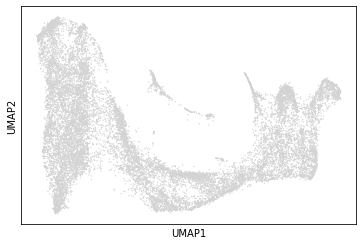

In [12]:
sc.pp.neighbors(rna_data, use_rep='X_joint_umap_features', metric = 'manhattan')
#sc.pp.neighbors(rna_data, use_rep='X_joint_topics', metric = 'hellinger')
sc.tl.umap(rna_data, min_dist = 0.1, negative_sample_rate=1)
sc.pl.umap(rna_data)

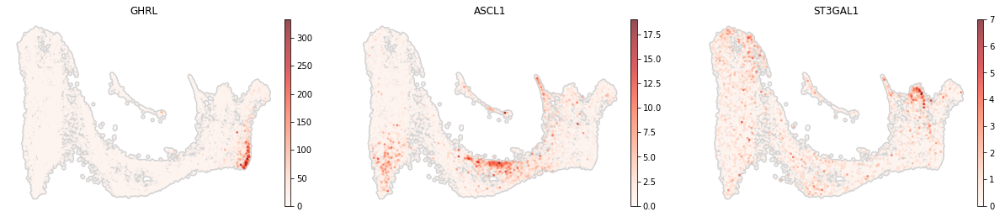

In [13]:
sc.pl.umap(rna_data, color = ['GHRL','ASCL1','ST3GAL1'], **mira.pref.raw_umap())

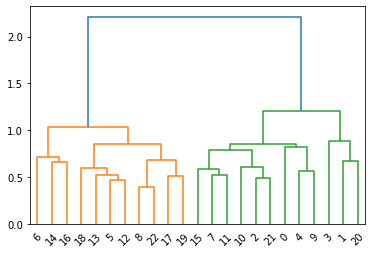

In [27]:
from scipy.cluster.hierarchy import dendrogram, to_tree

_ = dendrogram(rna_data.uns['topic_dendogram'])

In [32]:
for j, i in enumerate(to_tree(rna_data.uns['topic_dendogram'], rd=True)[1][rna_model.num_topics:]):
    print(j, ':', i.left.id, i.right.id)

0 : 8 22
1 : 5 12
2 : 2 21
3 : 17 19
4 : 13 24
5 : 7 11
6 : 4 9
7 : 15 28
8 : 18 27
9 : 10 25
10 : 14 16
11 : 1 20
12 : 23 26
13 : 6 33
14 : 30 32
15 : 0 29
16 : 31 35
17 : 37 38
18 : 3 34
19 : 36 39
20 : 40 41
21 : 42 43


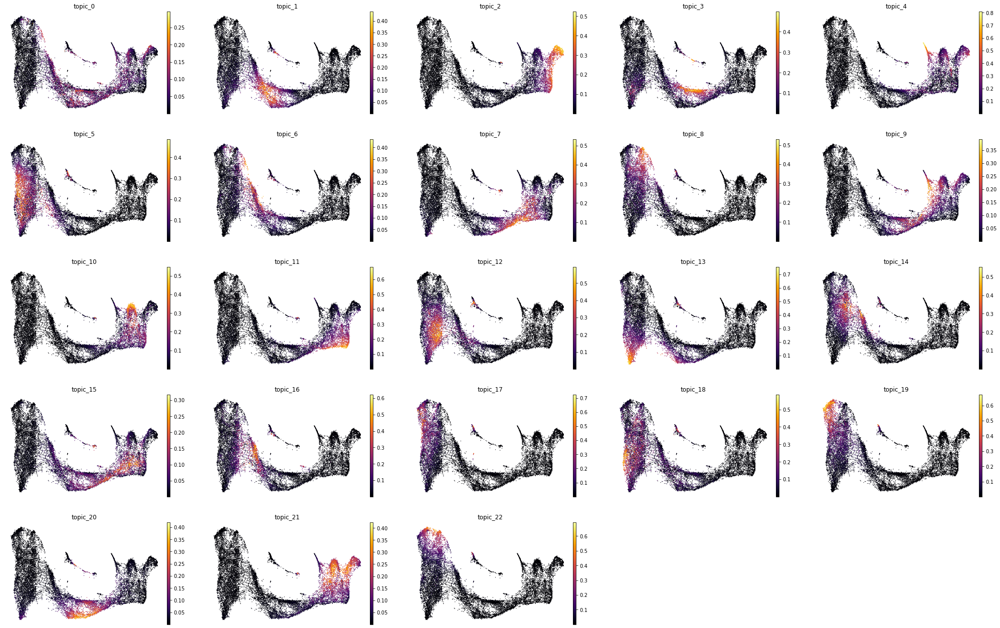

In [23]:
sc.pl.umap(rna_data, color = rna_model.topic_cols, **mira.pref.topic_umap(ncols=5))

In [24]:
atac_data.obsm['X_umap'] = rna_data.obsm['X_umap']

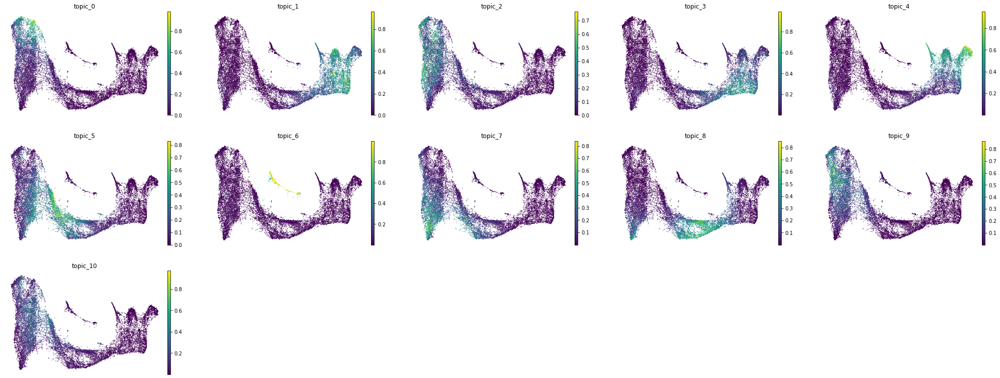

In [25]:
sc.pl.umap(atac_data, color = atac_model.topic_cols, **mira.pref.topic_umap(color_map = 'viridis', ncols = 5))

In [17]:
rna_data.obs[['ilr_' + str(i) for i in range(rna_model.num_topics-1)]] = rna_data.obsm['X_umap_features']

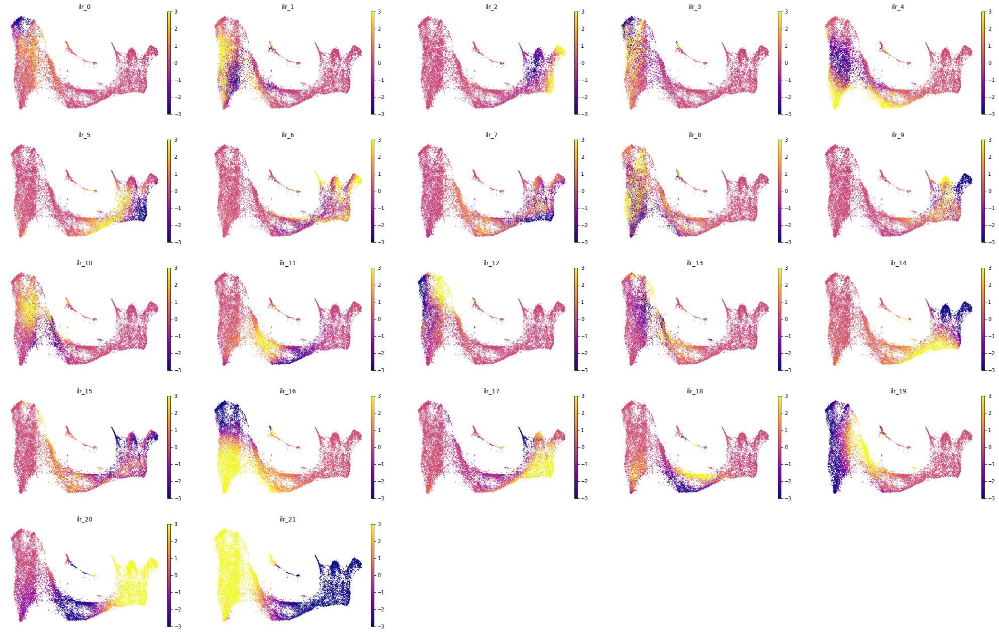

In [34]:
sc.pl.umap(rna_data, color = ['ilr_' + str(i) for i in range(rna_model.num_topics-1)], frameon=False, color_map='plasma', ncols=5, vmin = -3, vmax = 3)

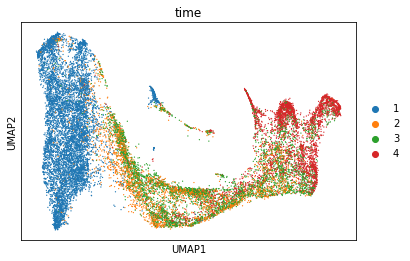

In [39]:
sc.pl.umap(rna_data, color = 'time')

In [37]:
rna_data.obs['time'] = rna_data.obs_names.str.split('-').str.get(-1)